In [1]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf

## Data Collection

In [2]:
! pip install -q kaggle

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"karrisrisaisowmya","key":"68dcbb531a67d24efddb882431d5c30b"}'}

In [4]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
from google.colab import files
files.upload()

Saving cookies.txt to cookies.txt


{'cookies.txt': b'# HTTP Cookie File downloaded with cookies.txt by Genuinous @genuinous\n# This file can be used by wget, curl, aria2c and other standard compliant tools.\n# Usage Examples:\n#   1) wget -x --load-cookies cookies.txt "https://www.kaggle.com/c/state-farm-distracted-driver-detection"\n#   2) curl --cookie cookies.txt "https://www.kaggle.com/c/state-farm-distracted-driver-detection"\n#   3) aria2c --load-cookies cookies.txt "https://www.kaggle.com/c/state-farm-distracted-driver-detection"\n#\nwww.kaggle.com\tFALSE\t/signin-google\tTRUE\t1594811742\t.AspNetCore.Correlation.Google.8HjTxuCVeWHFJNZPcnq0x5uSrbrmAvlBYbisNyILtMY\tN\nwww.kaggle.com\tFALSE\t/signin-google\tTRUE\t1594813205\t.AspNetCore.Correlation.Google.By-gwFGOP2wDXF3h_Wxs1jSnPR_mAvTth5lXKeikxbg\tN\nwww.kaggle.com\tFALSE\t/signin-google\tTRUE\t1594816230\t.AspNetCore.Correlation.Google.roCkJh0I3-zeVT9cmIaSUBno3z3hIE3ENNg1FjAuHnA\tN\nwww.kaggle.com\tFALSE\t/signin-google\tTRUE\t1594829516\t.AspNetCore.Correlation

In [7]:
!wget -x --load-cookies cookies.txt "https://www.kaggle.com/c/5048/download-all" -O data.zip
!unzip data.zip

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/c7/img_56661.jpg  
  inflating: imgs/train/c7/img_56699.jpg  
  inflating: imgs/train/c7/img_56717.jpg  
  inflating: imgs/train/c7/img_56724.jpg  
  inflating: imgs/train/c7/img_56768.jpg  
  inflating: imgs/train/c7/img_56779.jpg  
  inflating: imgs/train/c7/img_56849.jpg  
  inflating: imgs/train/c7/img_56899.jpg  
  inflating: imgs/train/c7/img_56938.jpg  
  inflating: imgs/train/c7/img_5706.jpg  
  inflating: imgs/train/c7/img_57076.jpg  
  inflating: imgs/train/c7/img_57122.jpg  
  inflating: imgs/train/c7/img_57137.jpg  
  inflating: imgs/train/c7/img_5715.jpg  
  inflating: imgs/train/c7/img_57278.jpg  
  inflating: imgs/train/c7/img_57321.jpg  
  inflating: imgs/train/c7/img_57345.jpg  
  inflating: imgs/train/c7/img_57355.jpg  
  inflating: imgs/train/c7/img_5741.jpg  
  inflating: imgs/train/c7/img_57433.jpg  
  inflating: imgs/train/c7/img_5753.jpg  
  inflating: imgs/train/c7/img_57559.jpg  
  infla

#### Checking the directories in which image data is stored

In [8]:
os.listdir("/content")

['.config',
 'data.zip',
 'cookies.txt',
 'sample_submission.csv',
 'driver_imgs_list.csv',
 'kaggle.json',
 'imgs',
 'sample_data']

In [9]:
os.listdir("/content/imgs")

['test', 'train']

In [10]:
os.listdir("/content/imgs/train")

['c4', 'c2', 'c1', 'c5', 'c8', 'c6', 'c3', 'c9', 'c7', 'c0']

**c0: safe driving <br>
c1: texting - right <br>
c2: talking on the phone - right <br>
c3: texting - left <br>
c4: talking on the phone - left <br>
c5: operating the radio <br>
c6: drinking <br>
c7: reaching behind <br>
c8: hair and makeup <br>
c9: talking to passenger <br>**

In [11]:
os.listdir("/content/imgs/test")

['img_10827.jpg',
 'img_11399.jpg',
 'img_13554.jpg',
 'img_73985.jpg',
 'img_18422.jpg',
 'img_71187.jpg',
 'img_90600.jpg',
 'img_62254.jpg',
 'img_84707.jpg',
 'img_4731.jpg',
 'img_27570.jpg',
 'img_99002.jpg',
 'img_18623.jpg',
 'img_74581.jpg',
 'img_50319.jpg',
 'img_91583.jpg',
 'img_25766.jpg',
 'img_64786.jpg',
 'img_54036.jpg',
 'img_80406.jpg',
 'img_17260.jpg',
 'img_99331.jpg',
 'img_80131.jpg',
 'img_72201.jpg',
 'img_19145.jpg',
 'img_61161.jpg',
 'img_23733.jpg',
 'img_45270.jpg',
 'img_60133.jpg',
 'img_12769.jpg',
 'img_56772.jpg',
 'img_26966.jpg',
 'img_12563.jpg',
 'img_26511.jpg',
 'img_101098.jpg',
 'img_3588.jpg',
 'img_61191.jpg',
 'img_7696.jpg',
 'img_43586.jpg',
 'img_55470.jpg',
 'img_47099.jpg',
 'img_46509.jpg',
 'img_9191.jpg',
 'img_97806.jpg',
 'img_84722.jpg',
 'img_74243.jpg',
 'img_57195.jpg',
 'img_30723.jpg',
 'img_2349.jpg',
 'img_88588.jpg',
 'img_49517.jpg',
 'img_29954.jpg',
 'img_527.jpg',
 'img_16189.jpg',
 'img_76109.jpg',
 'img_75079.jpg'

In [12]:
!rm -rf data.zip 

In [13]:
!rm -rf driver_imgs_list.csv
!rm -rf sample_submission.csv

### Loading data to directories

In [14]:
base_dir = "/content"
imgs_dir = os.path.join(base_dir,'imgs')
train_dir = os.path.join(imgs_dir,'train') 
test_dir = os.path.join(imgs_dir,'test')
train_c1 = os.path.join(train_dir,'c1')
train_c2 = os.path.join(train_dir,'c2')
train_c3 = os.path.join(train_dir,'c3')
train_c4 = os.path.join(train_dir,'c4')
train_c5 = os.path.join(train_dir,'c5')
train_c6 = os.path.join(train_dir,'c6')
train_c7 = os.path.join(train_dir,'c7')
train_c8 = os.path.join(train_dir,'c8')
train_c9 = os.path.join(train_dir,'c9')
train_c0 = os.path.join(train_dir,'c0')

In [15]:
# printing length of each category in train data
print(len(os.listdir("/content/imgs/train/c1")))
print(len(os.listdir("/content/imgs/train/c2")))
print(len(os.listdir("/content/imgs/train/c3")))
print(len(os.listdir("/content/imgs/train/c4")))
print(len(os.listdir("/content/imgs/train/c5")))
print(len(os.listdir("/content/imgs/train/c6")))
print(len(os.listdir("/content/imgs/train/c7")))
print(len(os.listdir("/content/imgs/train/c8")))
print(len(os.listdir("/content/imgs/train/c9")))

2267
2317
2346
2326
2312
2325
2002
1911
2129


In [16]:
print(len(os.listdir("/content/imgs/test")))

79726


In [17]:
#filenames
test_filename = os.listdir(test_dir)

c0_filename = os.listdir(train_c0)
c1_filename = os.listdir(train_c1)
c2_filename = os.listdir(train_c2)
c3_filename = os.listdir(train_c3)
c4_filename = os.listdir(train_c4)
c5_filename = os.listdir(train_c5)
c6_filename = os.listdir(train_c6)
c7_filename = os.listdir(train_c7)
c8_filename = os.listdir(train_c8)
c9_filename = os.listdir(train_c9)

In [18]:
print(test_filename[:4])
print(c0_filename[:4])
print(c1_filename[:4])
print(c2_filename[:4])
print(c3_filename[:4])
print(c4_filename[:4])
print(c5_filename[:4])
print(c6_filename[:4])
print(c7_filename[:4])
print(c8_filename[:4])
print(c9_filename[:4])

['img_10827.jpg', 'img_11399.jpg', 'img_13554.jpg', 'img_73985.jpg']
['img_30957.jpg', 'img_98143.jpg', 'img_93208.jpg', 'img_86851.jpg']
['img_35833.jpg', 'img_78001.jpg', 'img_2314.jpg', 'img_30552.jpg']
['img_25781.jpg', 'img_27518.jpg', 'img_86648.jpg', 'img_57904.jpg']
['img_28481.jpg', 'img_48169.jpg', 'img_55817.jpg', 'img_49082.jpg']
['img_43975.jpg', 'img_29986.jpg', 'img_73464.jpg', 'img_64071.jpg']
['img_99978.jpg', 'img_36200.jpg', 'img_80483.jpg', 'img_40370.jpg']
['img_97404.jpg', 'img_72425.jpg', 'img_80694.jpg', 'img_1722.jpg']
['img_15262.jpg', 'img_95855.jpg', 'img_16477.jpg', 'img_36425.jpg']
['img_31951.jpg', 'img_89953.jpg', 'img_5355.jpg', 'img_23932.jpg']
['img_43060.jpg', 'img_19160.jpg', 'img_83436.jpg', 'img_31830.jpg']


### Display image 

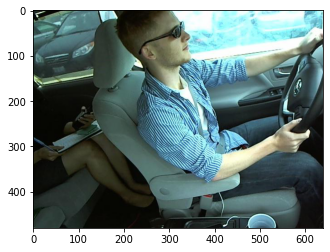

In [19]:
### Display image in c0 (safe driving)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c0+'/img_83502.jpg'))

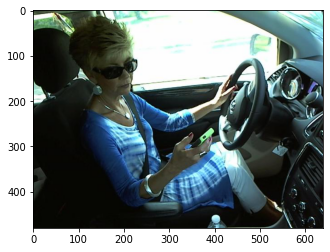

In [20]:
### Display image in c1 (texting - right)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c1+'/img_7317.jpg'))

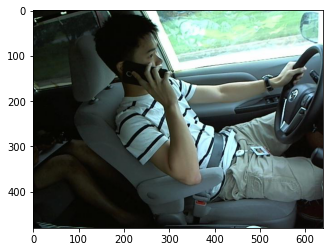

In [21]:
### Display image in c2 (talking on the phone - right)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c2+'/img_42941.jpg'))

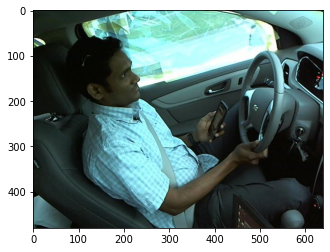

In [22]:
### Display image in c3 (texting - left)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c3+'/img_6132.jpg'))

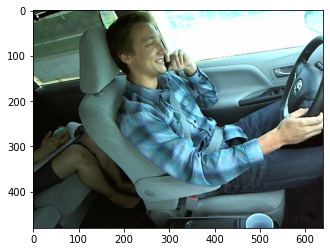

In [23]:
### Display image in c4 (talking on the phone - left)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c4+'/img_57786.jpg'))

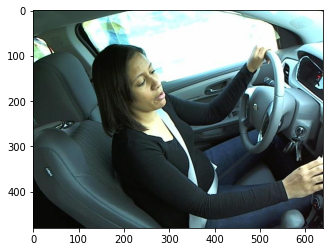

In [24]:
### Display image in c5 (operating the radio)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c5+'/img_80668.jpg'))

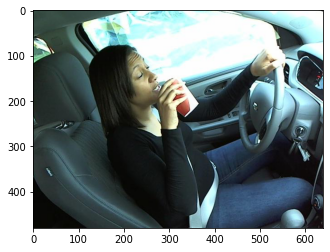

In [25]:
### Display image in c6 (drinking)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c6+'/img_22932.jpg'))

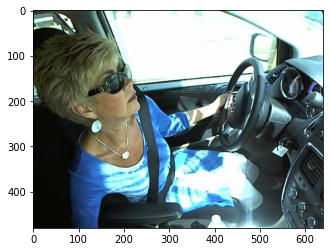

In [26]:
### Display image in c7 (reaching behind)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c7+'/img_80085.jpg'))

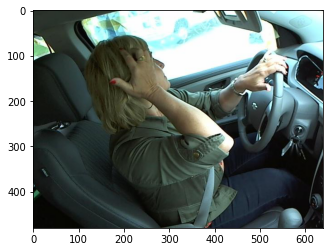

In [27]:
### Display image in c8 ( hair and makeup )
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c8+'/img_44416.jpg'))

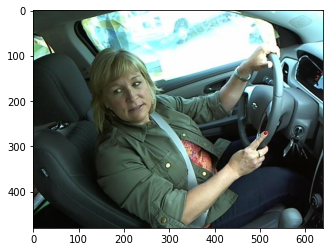

In [28]:
### Display image in c9 (talking to passenger)
import matplotlib.pyplot as plt
plt.imshow(plt.imread(train_c9+'/img_64982.jpg'))

#### Display of set of images

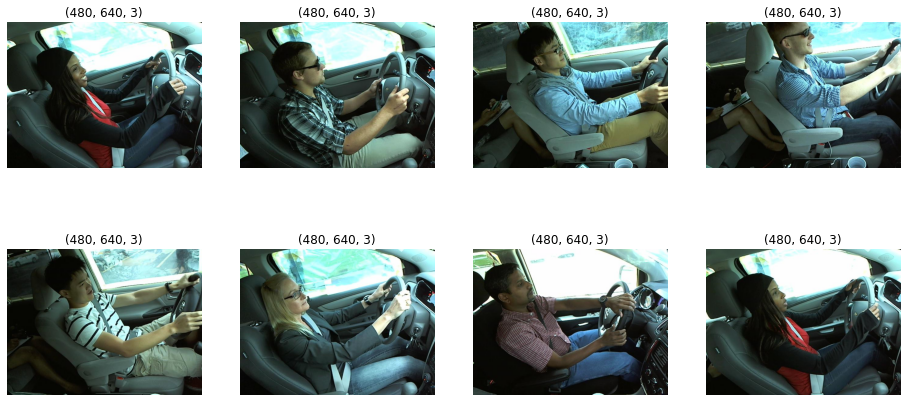

In [29]:
### Display of set of images in c0 ( safe driving )
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c0,c0_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

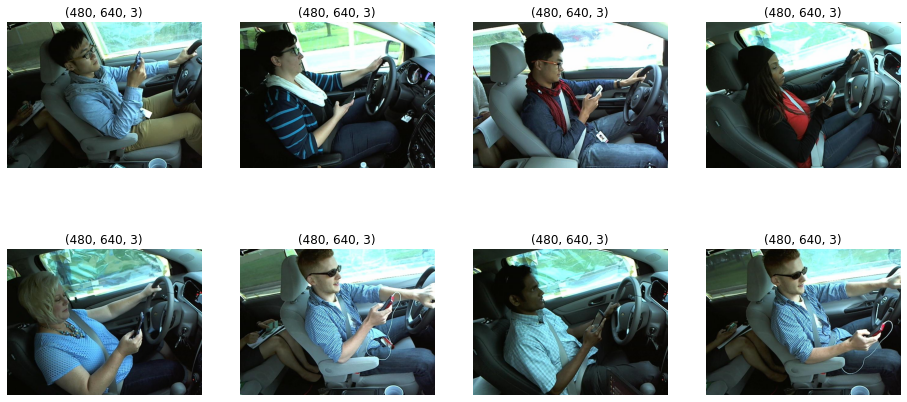

In [30]:
### Display of set of images in c1 ( texting - right)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c1,c1_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

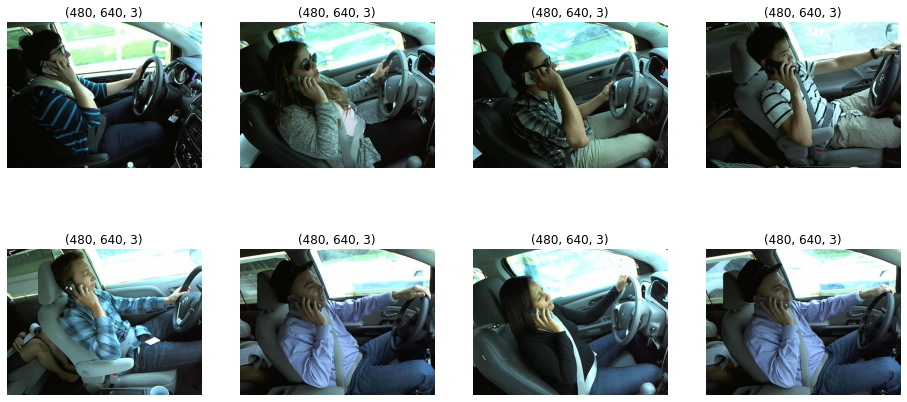

In [31]:
### Display of set of images in c2 (talking on the phone - right)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c2,c2_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

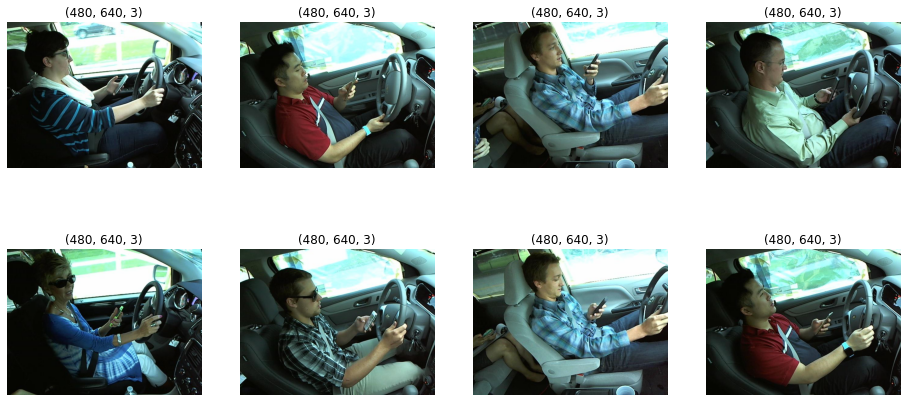

In [32]:
### Display of set of images in c3 (texting - left)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c3,c3_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

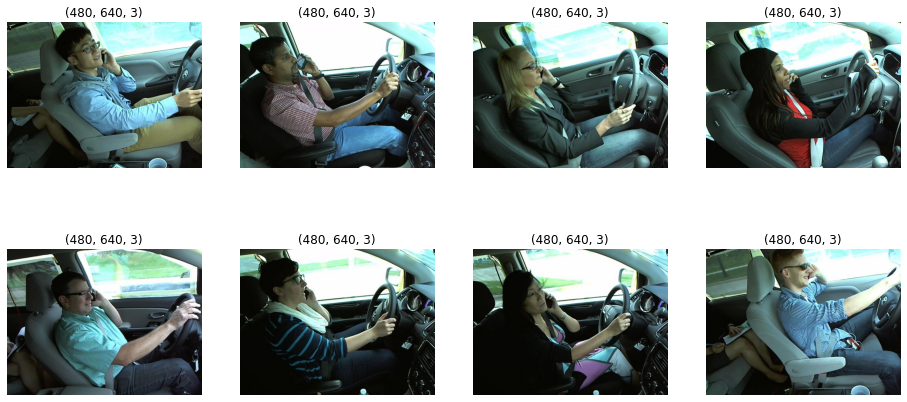

In [33]:
### Display of set of images in c4 (talking on the phone - left)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c4,c4_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

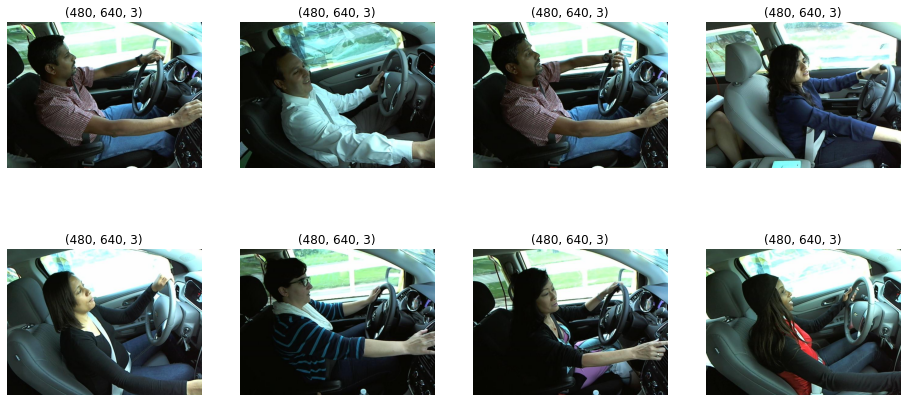

In [34]:
### Display of set of images in c5 (operating the radio)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c5,c5_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

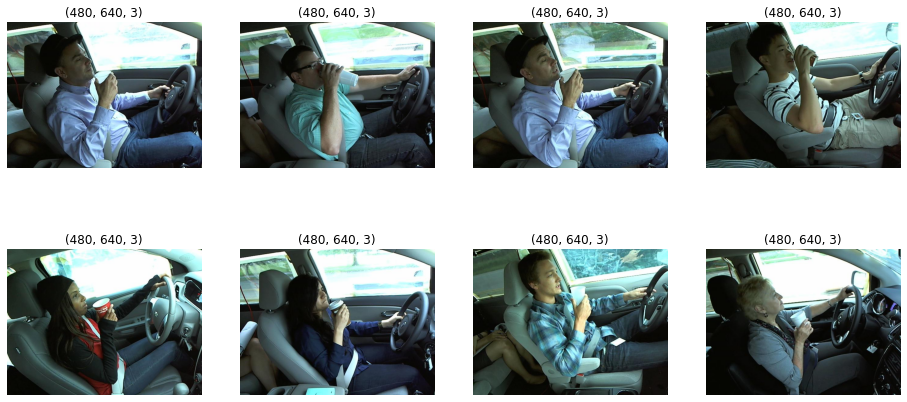

In [35]:
### Display of set of images in c6 (drinking)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c6,c6_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

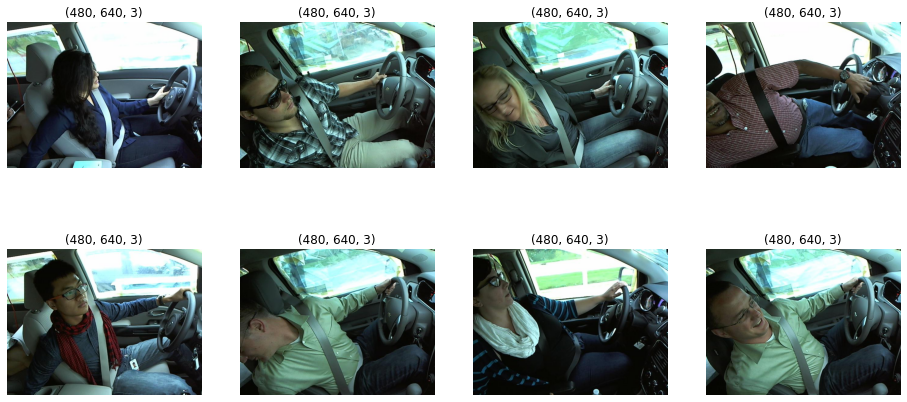

In [36]:
### Display of set of images in c7 ( reaching behind )
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c7,c7_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

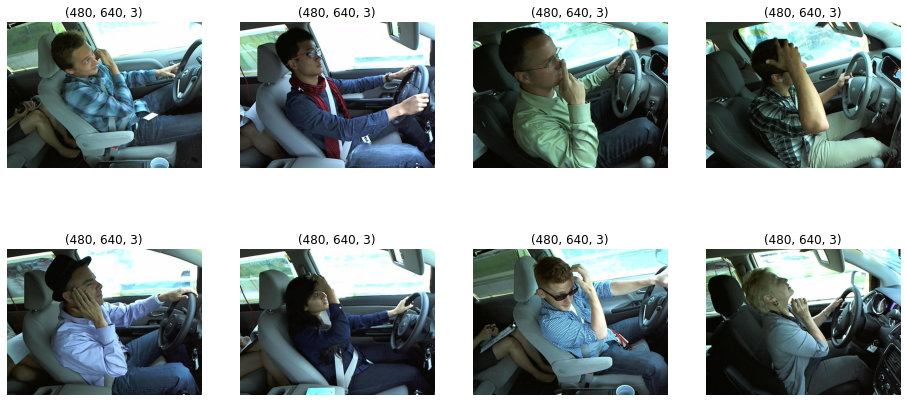

In [37]:
### Display of set of images in c8 ( hair and makeup )
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c8,c8_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

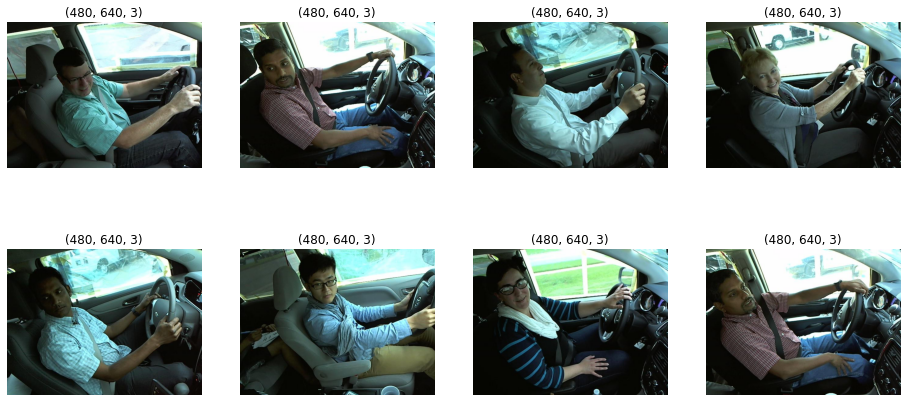

In [38]:
### Display of set of images in c9 (talking to passenger)
plt.figure(figsize=(16,16))
j = 1
for i in range(8):
  img = plt.imread(os.path.join(train_c9,c9_filename[i]))
  plt.subplot(4,4,j)
  plt.imshow(img)
  plt.title(img.shape)
  plt.axis('off')
  j += 1

### Data Preprocessing
Read the image data<br>
We have different shapes here.<br>
We need same shape for each image<br>
reshaping the images <br>
c0,c1,c2,c3,c4,c5,c6,c7,c8,c9 labelling <br>

### Creating Train and valiadtion data

In [39]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# create a new generator
imagegen = ImageDataGenerator(rescale=1./255, validation_split=0.3)
# load train data
train = imagegen.flow_from_directory(train_dir, class_mode="categorical",subset="training", batch_size=128, target_size=(224, 224))
# load val data
val = imagegen.flow_from_directory(train_dir, class_mode="categorical",subset="validation", batch_size=128, target_size=(224, 224))



Found 15702 images belonging to 10 classes.
Found 6722 images belonging to 10 classes.


In [40]:
train

### Generating random images

(128, 224, 224, 3)
(128, 10)


/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


Text(0.5, 1.0, '[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]')

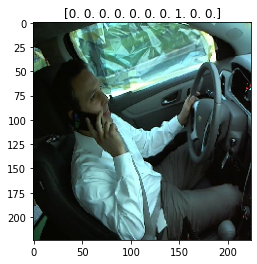

In [41]:
imgs,labels = train.next()
print(imgs.shape)
print(labels.shape)
plt.imshow(imgs[0,:,:,:])
plt.title(labels[i])

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


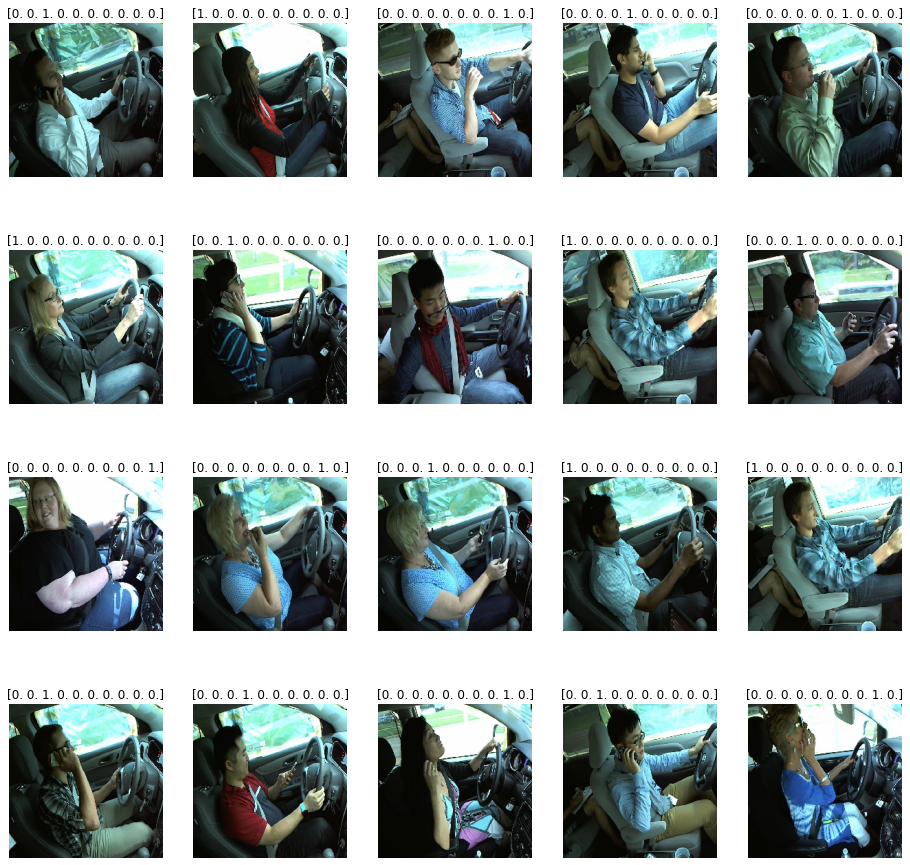

In [42]:
# set of random images
plt.figure(figsize=(16,16))
pos=1 ##plot position
for i in range(20):
  plt.subplot(4,5,pos)
  plt.imshow(imgs[i,:,:,:])# To display the image
  plt.title(labels[i])
  plt.axis('off')
  pos+=1

### Histogram (pixel distribution)

/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


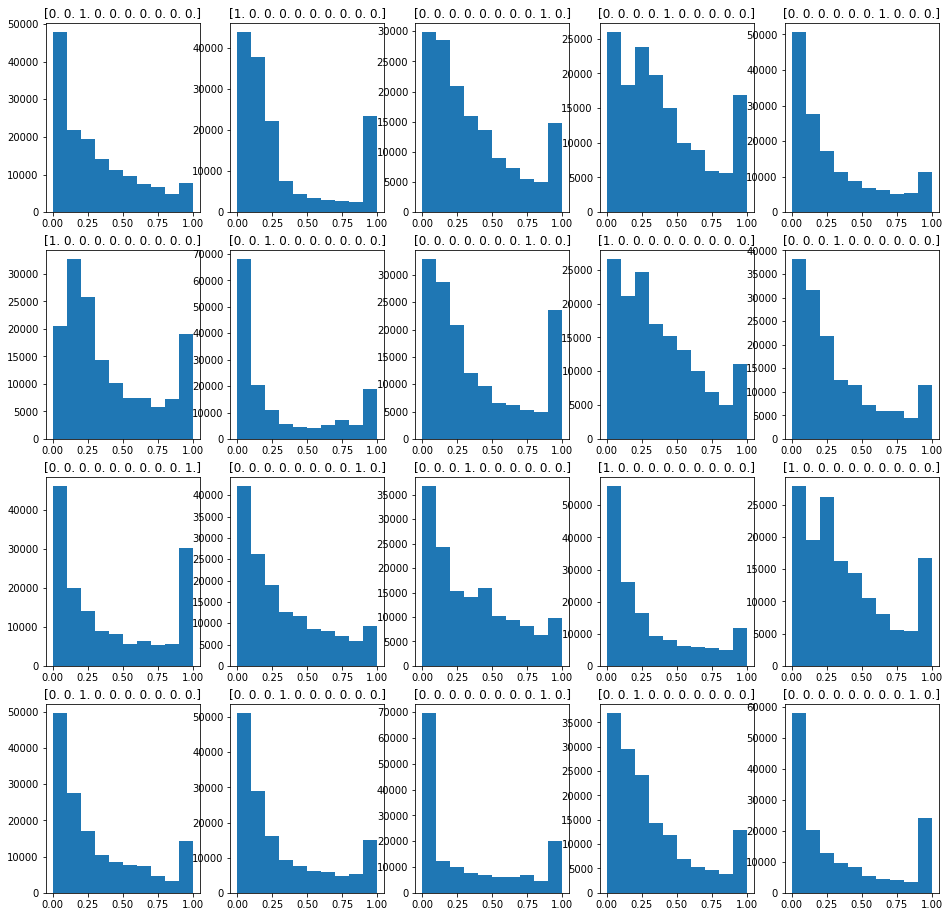

In [43]:
plt.figure(figsize=(16,16))
pos = 1  ## plot position
for i in range(20):
  plt.subplot(4,5,pos)
  plt.hist(imgs[i,:,:,:].flat) # To display the histogram
  plt.title(labels[i])
  pos += 1

## Model

In [44]:
### Build the model
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, InputLayer, BatchNormalization, Dropout

# build a sequential model
model = Sequential()
model.add(InputLayer(input_shape=(224, 224, 3)))

# 1st conv block
model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='same'))
# 2nd conv block
model.add(Conv2D(50, (5, 5), activation='relu', strides=(2, 2), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='same'))
model.add(BatchNormalization())
# 3rd conv block
model.add(Conv2D(70, (3, 3), activation='relu', strides=(2, 2), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='valid'))
model.add(BatchNormalization())
# ANN block
model.add(Flatten())
model.add(Dense(units=100, activation='relu'))
model.add(Dense(units=100, activation='relu'))
model.add(Dropout(0.25))
# output layer
model.add(Dense(units=10, activation='softmax'))

model.summary()

Using TensorFlow backend.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 25)      1900      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 25)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 56, 56, 50)        31300     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 28, 28, 50)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 50)        200       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 70)        31570     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 7, 7, 70)         

In [45]:
# compile model
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

### Train the model

In [46]:
# fit on data for 30 epochs 
history = model.fit_generator(train, epochs=30, validation_data=val)

Epoch 1/30
123/123 [==============================] - 133s 1s/step - loss: 1.0089 - accuracy: 0.6593 - val_loss: 2.1835 - val_accuracy: 0.2269
Epoch 2/30
123/123 [==============================] - 123s 1s/step - loss: 0.1232 - accuracy: 0.9674 - val_loss: 1.9122 - val_accuracy: 0.3816
Epoch 3/30
123/123 [==============================] - 125s 1s/step - loss: 0.0542 - accuracy: 0.9852 - val_loss: 0.2124 - val_accuracy: 0.9328
Epoch 4/30
123/123 [==============================] - 126s 1s/step - loss: 0.0325 - accuracy: 0.9903 - val_loss: 0.0796 - val_accuracy: 0.9689
Epoch 5/30
123/123 [==============================] - 125s 1s/step - loss: 0.0197 - accuracy: 0.9946 - val_loss: 0.0365 - val_accuracy: 0.9857
Epoch 6/30
123/123 [==============================] - 125s 1s/step - loss: 0.0120 - accuracy: 0.9969 - val_loss: 0.0223 - val_accuracy: 0.9908
Epoch 7/30
123/123 [==============================] - 124s 1s/step - loss: 0.0273 - accuracy: 0.9915 - val_loss: 0.0301 - val_accuracy: 0.9851

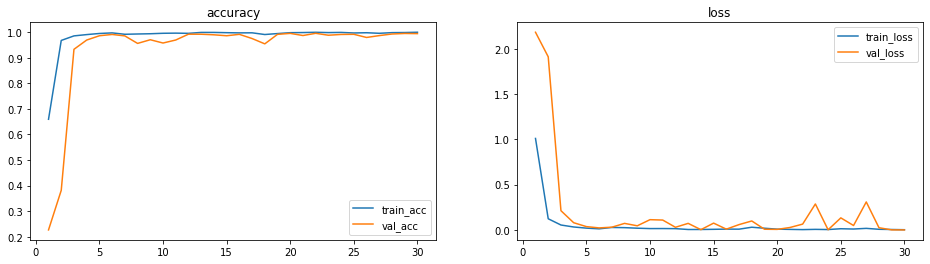

In [47]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = list(range(1,31))
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.plot(epochs,train_acc,label='train_acc')
plt.plot(epochs,val_acc,label='val_acc')
plt.title('accuracy')
plt.legend()
plt.subplot(1,2,2)
plt.plot(epochs,train_loss,label='train_loss')
plt.plot(epochs,val_loss,label='val_loss')
plt.title('loss')
plt.legend()

### To predict for an image


1.   Read the image
2.   check the shape

1.   Resize into required shape(1,150 X 150 X 3)
2.   Apply scaling

### EVALUATING WITH TEST DATA :

In [48]:
import random, os
path = '/content/imgs/test'
random_filename_test = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
from tensorflow.keras.preprocessing import image
import numpy as np
img = plt.imread(os.path.join(test_dir,random_filename_test))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)


img_100629.jpg


In [50]:
model.predict(img)

array([[1.8668225e-05, 9.9981636e-01, 8.8536617e-06, 2.1519804e-09,
        7.0483608e-10, 2.4779299e-09, 1.8650045e-08, 6.7524248e-08,
        1.5600555e-04, 5.6988581e-12]], dtype=float32)

In [51]:
classes = model.predict_classes(img)
print ("class : ",classes)
if (classes == 0):
  print("safely driving")
if (classes == 1):
  print("texting - right")
if (classes == 2):
  print("talking on the phone - right")
if (classes == 3):
  print("texting - left")
if (classes == 4):
  print(" texting - left")
if (classes == 5):
  print(" operating the radio")
if (classes == 6):
  print("drinking")
if (classes == 7):
  print("reaching behind")
if (classes == 8):
  print("hair and makeup")
if (classes == 9):
  print("talking to passenger")

class :  [1]
texting - right


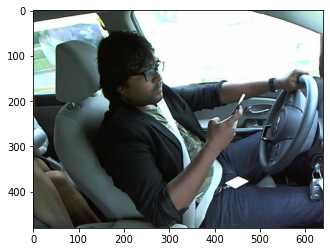

In [54]:
img = plt.imread(os.path.join(test_dir,random_filename_test))
plt.imshow(img)

**c0: safe driving <br>
c1: texting - right <br>
c2: talking on the phone - right <br>
c3: texting - left <br>
c4: talking on the phone - left <br>
c5: operating the radio <br>
c6: drinking <br>
c7: reaching behind <br>
c8: hair and makeup <br>
c9: talking to passenger <br>**

### EVALUATING ON TRAIN AND VAL DATA :

In [55]:
import random, os
path = '/content/imgs/train/c0'
random_filename_train_c0 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c0,random_filename_train_c0))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [56]:
model.predict(img)

array([[9.9999976e-01, 2.0026547e-10, 4.4037674e-10, 1.7705308e-11,
        2.3044292e-11, 6.1268850e-08, 1.5863412e-13, 6.8490455e-13,
        1.2537706e-12, 9.9305673e-08]], dtype=float32)

[0]


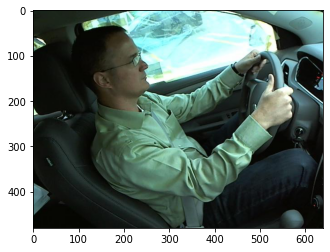

In [57]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c0,random_filename_train_c0))
plt.imshow(img)

In [58]:
import random, os
path = '/content/imgs/train/c1'
random_filename_train_c1 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c1,random_filename_train_c1))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [59]:
model.predict(img)

array([[5.1119917e-09, 1.0000000e+00, 3.4008107e-12, 6.1899471e-13,
        1.6164382e-14, 1.2823806e-15, 2.0951440e-11, 8.7369660e-14,
        1.0984864e-11, 1.8616346e-10]], dtype=float32)

[1]


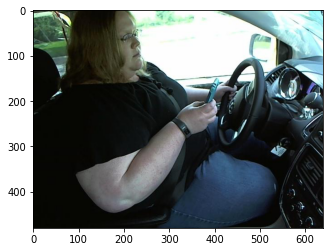

In [60]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c1,random_filename_train_c1))
plt.imshow(img)

In [61]:
import random, os
path = '/content/imgs/train/c2'
random_filename_train_c2 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c2,random_filename_train_c2))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [62]:
model.predict(img)

array([[6.8645011e-07, 8.1706082e-09, 9.9999821e-01, 4.7283766e-10,
        3.5840003e-08, 1.8087880e-08, 3.0804628e-08, 2.8262457e-09,
        2.3342585e-08, 9.2469611e-07]], dtype=float32)

[2]


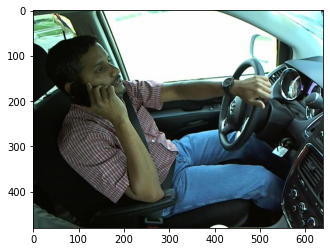

In [63]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c2,random_filename_train_c2))
plt.imshow(img)

In [64]:
import random, os
path = '/content/imgs/train/c3'
random_filename_train_c3 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c3,random_filename_train_c3))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [65]:
model.predict(img)

array([[2.0995181e-13, 1.9784053e-11, 5.5822135e-15, 1.0000000e+00,
        3.2226588e-10, 4.2082304e-15, 4.3444958e-16, 5.8841934e-16,
        1.0595154e-15, 1.0693311e-12]], dtype=float32)

[3]


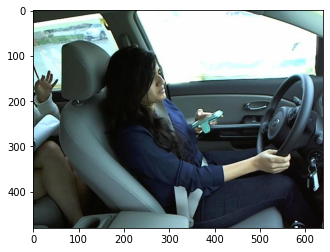

In [66]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c3,random_filename_train_c3))
plt.imshow(img)

In [67]:
import random, os
path = '/content/imgs/train/c4'
random_filename_train_c4 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c4,random_filename_train_c4))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [68]:
model.predict(img)

array([[4.9643771e-14, 2.6963228e-17, 2.4167439e-12, 5.5139232e-13,
        1.0000000e+00, 7.2880374e-12, 4.8854920e-10, 2.3813162e-14,
        4.9605343e-14, 3.5687548e-15]], dtype=float32)

[4]


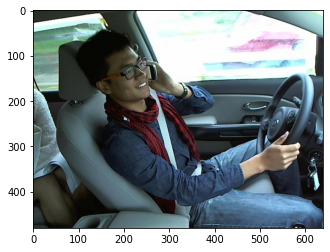

In [69]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c4,random_filename_train_c4))
plt.imshow(img)

In [70]:
import random, os
path = '/content/imgs/train/c5'
random_filename_train_c5 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c5,random_filename_train_c5))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [71]:
model.predict(img)

array([[3.2606264e-22, 4.1419827e-27, 9.2054927e-20, 5.5767603e-24,
        1.0298411e-21, 1.0000000e+00, 3.3256662e-18, 1.9299505e-21,
        7.1177147e-20, 2.0911966e-21]], dtype=float32)

[5]


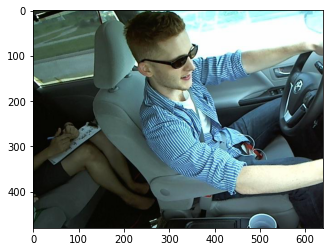

In [72]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c5,random_filename_train_c5))
plt.imshow(img)

In [73]:
import random, os
path = '/content/imgs/train/c6'
random_filename_train_c6 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c6,random_filename_train_c6))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [74]:
model.predict(img)

array([[3.5145983e-11, 8.3368333e-11, 6.9514206e-10, 1.2311784e-14,
        3.1039483e-11, 2.1551223e-06, 9.9999774e-01, 1.5948664e-09,
        1.1167253e-08, 4.8694286e-08]], dtype=float32)

[6]


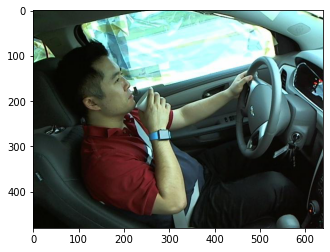

In [75]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c6,random_filename_train_c6))
plt.imshow(img)

In [76]:
import random, os
path = '/content/imgs/train/c7'
random_filename_train_c7 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c7,random_filename_train_c7))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [77]:
model.predict(img)

array([[4.96079889e-14, 2.44301024e-10, 1.02159105e-17, 7.09950260e-17,
        9.49601755e-17, 4.79142140e-20, 7.74991358e-19, 1.00000000e+00,
        7.43653472e-11, 1.32216454e-15]], dtype=float32)

[7]


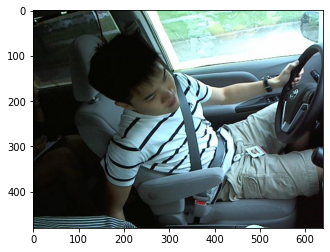

In [78]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c7,random_filename_train_c7))
plt.imshow(img)

In [79]:
import random, os
path = '/content/imgs/train/c8'
random_filename_train_c8 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c8,random_filename_train_c8))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [80]:
model.predict(img)

array([[9.1126780e-16, 4.2527506e-17, 7.9168960e-17, 1.3779675e-16,
        3.1103898e-12, 3.1615623e-14, 1.2547343e-17, 1.8390773e-12,
        1.0000000e+00, 7.5297529e-14]], dtype=float32)

[8]


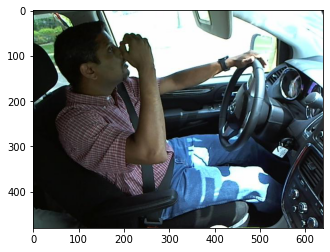

In [81]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c8,random_filename_train_c8))
plt.imshow(img)

In [82]:
import random, os
path = '/content/imgs/train/c9'
random_filename_train_c9 = random.choice([
    x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path, x))
])
img = plt.imread(os.path.join(train_dir,train_c9,random_filename_train_c9))
print(type(img))
img = tf.keras.preprocessing.image.img_to_array(img)
print(img.shape)
print(type(img))
img = tf.image.resize(img,(224,224))
## Scaling 
img = img/255
print(img.shape)
img = np.expand_dims(img,axis=0)
print(img.shape)

<class 'numpy.ndarray'>
(480, 640, 3)
<class 'numpy.ndarray'>
(224, 224, 3)
(1, 224, 224, 3)


In [83]:
model.predict(img)

array([[1.9347329e-08, 8.8398429e-13, 7.6585391e-13, 3.5104835e-13,
        1.4782972e-10, 8.0906125e-07, 3.3566406e-13, 4.9015028e-09,
        2.9455432e-05, 9.9996972e-01]], dtype=float32)

[9]


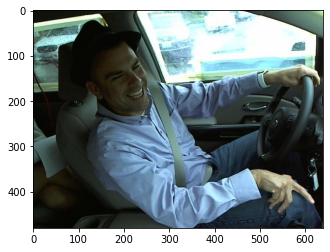

In [84]:
classes = model.predict_classes(img)
print (classes)
img = plt.imread(os.path.join(train_dir,train_c9,random_filename_train_c9))
plt.imshow(img)